In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
pd.set_option('display.max_columns', None)  
pd.set_option('display.max_rows', None)  


In [3]:
#importing leads.csv
lead_df = pd.read_csv("Leads.csv")

In [4]:
lead_df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [5]:
lead_df.shape

(9240, 37)

Lets check for the datatype and null value in the dataset.

In [6]:
lead_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [7]:
round(lead_df.describe(percentiles=[0.25,0.50,0.75,0.90]),2)

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.00,9240.00,9103.00,9240.00,9103.00,5022.00,5022.00
mean,617188.44,0.39,3.45,487.70,2.36,14.31,16.34
std,23406.00,0.49,4.85,548.02,2.16,1.39,1.81
min,579533.00,0.00,0.00,0.00,0.00,7.00,11.00
25%,596484.50,0.00,1.00,12.00,1.00,14.00,15.00
50%,615479.00,0.00,3.00,248.00,2.00,14.00,16.00
75%,637387.25,1.00,5.00,936.00,3.00,15.00,18.00
90%,650506.10,1.00,7.00,1380.00,5.00,16.00,19.00
max,660737.00,1.00,251.00,2272.00,55.00,18.00,20.00


Most of the columns have some data missing in them.
Lets check the percentage per column.

Initial observations: - 
- Select variable is nothing but a option not selected. so we can replace it will null value.
- Most of the columns have missing values.
- Single variable columns are no of our use.
- Converted column is the target/depended column.
- Prospect ID and Lead number columns can be neglated for the further studies.

First of all lets replace all select with nan.

In [8]:
lead_df.replace("Select",np.nan,inplace=True)

In [9]:
lead_df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,NaN,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,NaN,NaN,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,NaN,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,NaN,NaN,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,NaN,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,NaN,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,NaN,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,NaN,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


Lets delete prospect ID and Lead Number as they are of no particular use in our analysis.

In [10]:
lead_df = lead_df.iloc[:,2:]

In [11]:
for col in lead_df.columns:
    print("==================================================================")
    print("{}".format(col))
    print(lead_df[col].value_counts())
    print("==================================================================")

Lead Origin
Landing Page Submission    4886
API                        3580
Lead Add Form               718
Lead Import                  55
Quick Add Form                1
Name: Lead Origin, dtype: int64
Lead Source
Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Click2call              4
Press_Release           2
Live Chat               2
Social Media            2
WeLearn                 1
welearnblog_Home        1
youtubechannel          1
testone                 1
NC_EDM                  1
Pay per Click Ads       1
blog                    1
Name: Lead Source, dtype: int64
Do Not Email
No     8506
Yes     734
Name: Do Not Email, dtype: int64
Do Not Call
No     9238
Yes       2
Name: Do Not Call, dtype: int64
Converted
0    5679
1    3561
Name: Converted, dtype: int64
TotalVis

Name: Last Notable Activity, dtype: int64


Some iobservations: -
- Lets convert categorical column to categorical data type from obejct.
- For numeric number not having more than 65,500 digits i.e not the case in any of the column so lets convert numerical(float64 , int64 bit) columns to float16 and int 8.
- columns such as "I agree to pay the amount through cheque","Get updates on DM Content","Update me on Supply Chain Content","Receive More Updates About Our Courses","Through Recommendations","Digital Advertisement","Newspaper","X Education Forums","Newspaper Article","Magazine","Search","What matters most to you in choosing a course" have either one variable or oen variable having more than 90% of data in the column.


### Data Cleaning and Null value compensation.

We can remove one variable column and columns which have only one variable dominance they are of no use for our analysis.

In [12]:
cols = [ "I agree to pay the amount through cheque","Get updates on DM Content","Update me on Supply Chain Content","Receive More Updates About Our Courses","Through Recommendations","Digital Advertisement","Newspaper","X Education Forums","Newspaper Article","Magazine","Search","What matters most to you in choosing a course"]
lead_df.drop(cols,axis=1,inplace=True)

In [13]:
lead_df.shape

(9240, 23)

In [14]:
lead_df

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,Tags,Lead Quality,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,A free copy of Mastering The Interview,Last Notable Activity
0,API,Olark Chat,No,No,0,0.0,0,0.00,Page Visited on Website,NaN,NaN,NaN,Unemployed,Interested in other courses,Low in Relevance,NaN,NaN,02.Medium,02.Medium,15.0,15.0,No,Modified
1,API,Organic Search,No,No,0,5.0,674,2.50,Email Opened,India,NaN,NaN,Unemployed,Ringing,NaN,NaN,NaN,02.Medium,02.Medium,15.0,15.0,No,Email Opened
2,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.00,Email Opened,India,Business Administration,NaN,Student,Will revert after reading the email,Might be,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,Yes,Email Opened
3,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.00,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Ringing,Not Sure,NaN,Mumbai,02.Medium,01.High,13.0,17.0,No,Modified
4,Landing Page Submission,Google,No,No,1,2.0,1428,1.00,Converted to Lead,India,NaN,Other,Unemployed,Will revert after reading the email,Might be,NaN,Mumbai,02.Medium,01.High,15.0,18.0,No,Modified
5,API,Olark Chat,No,No,0,0.0,0,0.00,Olark Chat Conversation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,01.High,02.Medium,17.0,15.0,No,Modified
6,Landing Page Submission,Google,No,No,1,2.0,1640,2.00,Email Opened,India,Supply Chain Management,Online Search,Unemployed,Will revert after reading the email,Low in Relevance,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Modified
7,API,Olark Chat,No,No,0,0.0,0,0.00,Olark Chat Conversation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,02.Medium,02.Medium,15.0,15.0,No,Modified
8,Landing Page Submission,Direct Traffic,No,No,0,2.0,71,2.00,Email Opened,India,IT Projects Management,NaN,NaN,NaN,NaN,NaN,Thane & Outskirts,02.Medium,02.Medium,14.0,14.0,Yes,Email Opened
9,API,Google,No,No,0,4.0,58,4.00,Email Opened,India,Finance Management,Word Of Mouth,NaN,NaN,NaN,NaN,Mumbai,02.Medium,02.Medium,13.0,16.0,No,Email Opened


lets delete the columns having null values more than 35%.

In [15]:
del_condition = lead_df.columns[(lead_df.isnull().sum()/len(lead_df)*100)>35]

In [16]:
lead_df.drop(del_condition,axis=1,inplace=True)

In [17]:
lead_df.shape

(9240, 13)

In [18]:
null_cols = lead_df.isnull().sum()/len(lead_df)*100
null_cols

Lead Origin                                0.000000
Lead Source                                0.389610
Do Not Email                               0.000000
Do Not Call                                0.000000
Converted                                  0.000000
TotalVisits                                1.482684
Total Time Spent on Website                0.000000
Page Views Per Visit                       1.482684
Last Activity                              1.114719
Country                                   26.634199
What is your current occupation           29.112554
A free copy of Mastering The Interview     0.000000
Last Notable Activity                      0.000000
dtype: float64

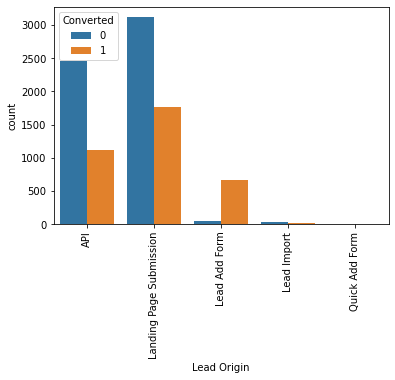

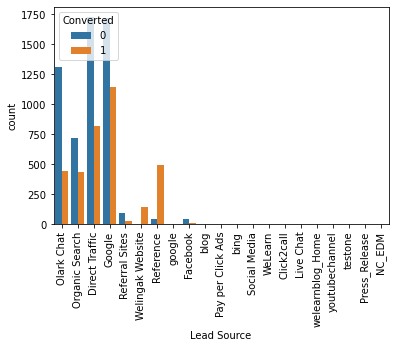

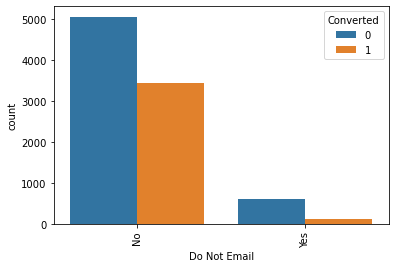

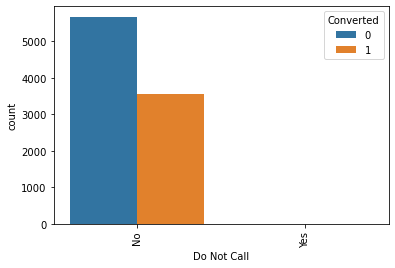

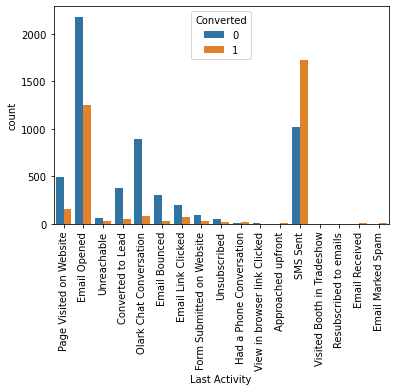

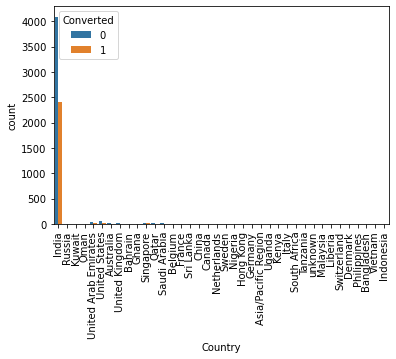

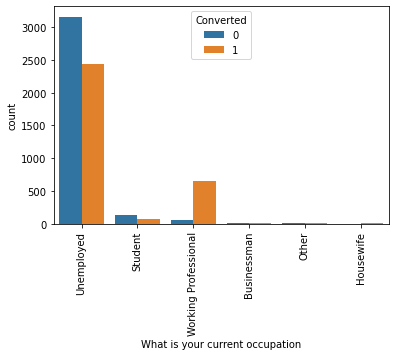

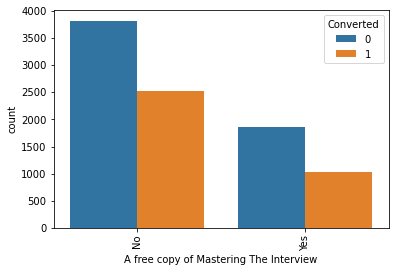

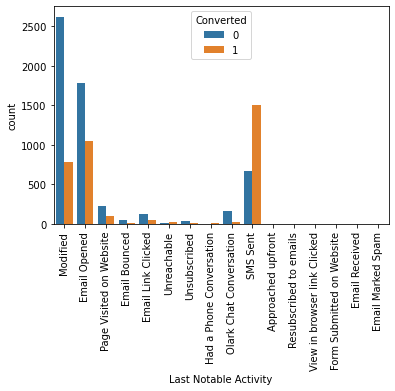

In [19]:
for col in lead_df.select_dtypes(include="O"):
    sns.countplot(x = lead_df[col],hue = lead_df["Converted"])
    plt.xticks(rotation=90)
    plt.show()

Some observations: - 
- Lead origin column having lead aff form variable has very high converted rate compared to unconverted.
- Lead source contains olark chat, organic search, google have max values.
- Do not call has no yes.
- Countries column doesnt seem to make any impact if the lead is not from india.
- working professionals having high convergance rate.
- a free master copy of interview have no adverse effect on wether a lead is converted or not.


In [20]:
# lets drop country and A free copy of Mastering The Interview columns.
lead_df.drop("Country",axis=1,inplace=True)
lead_df.drop("A free copy of Mastering The Interview",axis=1,inplace=True)
lead_df.drop("Last Notable Activity",axis=1,inplace=True) # similiar to last activity.
lead_df.drop("Do Not Call",axis=1,inplace=True) #it does not have any yes value

In [21]:
lead_df.shape

(9240, 9)

In [22]:
lead_df.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,What is your current occupation
0,API,Olark Chat,No,0,0.0,0,0.0,Page Visited on Website,Unemployed
1,API,Organic Search,No,0,5.0,674,2.5,Email Opened,Unemployed
2,Landing Page Submission,Direct Traffic,No,1,2.0,1532,2.0,Email Opened,Student
3,Landing Page Submission,Direct Traffic,No,0,1.0,305,1.0,Unreachable,Unemployed
4,Landing Page Submission,Google,No,1,2.0,1428,1.0,Converted to Lead,Unemployed


In [23]:
lead_df.isnull().sum()/len(lead_df)*100

Lead Origin                         0.000000
Lead Source                         0.389610
Do Not Email                        0.000000
Converted                           0.000000
TotalVisits                         1.482684
Total Time Spent on Website         0.000000
Page Views Per Visit                1.482684
Last Activity                       1.114719
What is your current occupation    29.112554
dtype: float64

Since we have more than 9000 rows for analysis and max missing data in column is 29 we can simply delete all the rows having missing value. We could have imputed values based on mean and max occurance but since we have enough data lets keep the data set exact and original as much as possible.

In [24]:
lead_df.drop(index=lead_df[lead_df.isna().any(axis=1)].index,axis=0,inplace=True)

In [25]:
lead_df.shape

(6391, 9)

In [26]:
lead_df.isnull().sum()

Lead Origin                        0
Lead Source                        0
Do Not Email                       0
Converted                          0
TotalVisits                        0
Total Time Spent on Website        0
Page Views Per Visit               0
Last Activity                      0
What is your current occupation    0
dtype: int64

### Creating dummy variable.

In [27]:
# lets map no as zero and yes as one in do not email column
lead_df["Do Not Email"]=lead_df["Do Not Email"].map({"Yes":1,"No":0})

In [28]:
dummy_df =pd.get_dummies(lead_df[["Lead Origin","Lead Source","Last Activity","What is your current occupation"]],prefix=["origin","source","last_activity","occupation"])

In [29]:
dummy_df.head()

,origin_API,origin_Landing Page Submission,origin_Lead Add Form,origin_Lead Import,source_Click2call,source_Direct Traffic,source_Facebook,source_Google,source_Live Chat,source_Olark Chat,source_Organic Search,source_Pay per Click Ads,source_Press_Release,source_Reference,source_Referral Sites,source_Social Media,source_WeLearn,source_Welingak Website,source_bing,source_testone,last_activity_Approached upfront,last_activity_Converted to Lead,last_activity_Email Bounced,last_activity_Email Link Clicked,last_activity_Email Marked Spam,last_activity_Email Opened,last_activity_Email Received,last_activity_Form Submitted on Website,last_activity_Had a Phone Conversation,last_activity_Olark Chat Conversation,last_activity_Page Visited on Website,last_activity_SMS Sent,last_activity_Unreachable,last_activity_Unsubscribed,last_activity_View in browser link Clicked,last_activity_Visited Booth in Tradeshow,occupation_Businessman,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional
0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
4,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [30]:
edu_lead = pd.concat([lead_df[["Do Not Email","Converted","TotalVisits","Total Time Spent on Website","Page Views Per Visit"]],dummy_df],axis=1)

In [31]:
edu_lead.head()

,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,origin_API,origin_Landing Page Submission,origin_Lead Add Form,origin_Lead Import,source_Click2call,source_Direct Traffic,source_Facebook,source_Google,source_Live Chat,source_Olark Chat,source_Organic Search,source_Pay per Click Ads,source_Press_Release,source_Reference,source_Referral Sites,source_Social Media,source_WeLearn,source_Welingak Website,source_bing,source_testone,last_activity_Approached upfront,last_activity_Converted to Lead,last_activity_Email Bounced,last_activity_Email Link Clicked,last_activity_Email Marked Spam,last_activity_Email Opened,last_activity_Email Received,last_activity_Form Submitted on Website,last_activity_Had a Phone Conversation,last_activity_Olark Chat Conversation,last_activity_Page Visited on Website,last_activity_SMS Sent,last_activity_Unreachable,last_activity_Unsubscribed,last_activity_View in browser link Clicked,last_activity_Visited Booth in Tradeshow,occupation_Businessman,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional
0,0,0,0.0,0,0.0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
1,0,0,5.0,674,2.5,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,1,2.0,1532,2.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,1.0,305,1.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
4,0,1,2.0,1428,1.0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [32]:
from sklearn.preprocessing import MinMaxScaler

In [33]:
scaler = MinMaxScaler()

In [34]:
edu_lead[["TotalVisits","Total Time Spent on Website","Page Views Per Visit"]] = scaler.fit_transform(edu_lead[["TotalVisits","Total Time Spent on Website","Page Views Per Visit"]])

In [35]:
edu_lead.head()

,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,origin_API,origin_Landing Page Submission,origin_Lead Add Form,origin_Lead Import,source_Click2call,source_Direct Traffic,source_Facebook,source_Google,source_Live Chat,source_Olark Chat,source_Organic Search,source_Pay per Click Ads,source_Press_Release,source_Reference,source_Referral Sites,source_Social Media,source_WeLearn,source_Welingak Website,source_bing,source_testone,last_activity_Approached upfront,last_activity_Converted to Lead,last_activity_Email Bounced,last_activity_Email Link Clicked,last_activity_Email Marked Spam,last_activity_Email Opened,last_activity_Email Received,last_activity_Form Submitted on Website,last_activity_Had a Phone Conversation,last_activity_Olark Chat Conversation,last_activity_Page Visited on Website,last_activity_SMS Sent,last_activity_Unreachable,last_activity_Unsubscribed,last_activity_View in browser link Clicked,last_activity_Visited Booth in Tradeshow,occupation_Businessman,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional
0,0,0,0.000000,0.000000,0.000000,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0.019920,0.296655,0.045455,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,1,0.007968,0.674296,0.036364,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0.003984,0.134243,0.018182,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
4,0,1,0.007968,0.628521,0.018182,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


### MOdel Building

In [36]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

In [37]:
y = edu_lead["Converted"]
x = edu_lead.drop("Converted",axis=1)

In [38]:
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.30,random_state=100)

In [39]:
x_train.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,origin_API,origin_Landing Page Submission,origin_Lead Add Form,origin_Lead Import,source_Click2call,source_Direct Traffic,source_Facebook,source_Google,source_Live Chat,source_Olark Chat,source_Organic Search,source_Pay per Click Ads,source_Press_Release,source_Reference,source_Referral Sites,source_Social Media,source_WeLearn,source_Welingak Website,source_bing,source_testone,last_activity_Approached upfront,last_activity_Converted to Lead,last_activity_Email Bounced,last_activity_Email Link Clicked,last_activity_Email Marked Spam,last_activity_Email Opened,last_activity_Email Received,last_activity_Form Submitted on Website,last_activity_Had a Phone Conversation,last_activity_Olark Chat Conversation,last_activity_Page Visited on Website,last_activity_SMS Sent,last_activity_Unreachable,last_activity_Unsubscribed,last_activity_View in browser link Clicked,last_activity_Visited Booth in Tradeshow,occupation_Businessman,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional
533,0,0.011952,0.364877,0.054545,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
846,0,0.000000,0.000000,0.000000,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
7546,0,0.035857,0.372359,0.163636,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
8631,0,0.019920,0.397447,0.090909,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
7824,0,0.003984,0.081866,0.018182,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [40]:
# initializing classifier.
logisticRegr = LogisticRegression()

In [41]:
logisticRegr.fit(x_train,y_train)

LogisticRegression()

In [42]:
# RFE model feature selection
from sklearn.feature_selection import RFE
rfe = RFE(logisticRegr, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(x_train, y_train)

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass n_features_to_select=15 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


In [43]:
list(zip(x_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('TotalVisits', True, 1),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 22),
 ('origin_API', False, 5),
 ('origin_Landing Page Submission', False, 4),
 ('origin_Lead Add Form', True, 1),
 ('origin_Lead Import', False, 10),
 ('source_Click2call', False, 8),
 ('source_Direct Traffic', False, 11),
 ('source_Facebook', False, 15),
 ('source_Google', False, 14),
 ('source_Live Chat', False, 25),
 ('source_Olark Chat', True, 1),
 ('source_Organic Search', False, 12),
 ('source_Pay per Click Ads', False, 31),
 ('source_Press_Release', False, 28),
 ('source_Reference', False, 19),
 ('source_Referral Sites', False, 13),
 ('source_Social Media', False, 20),
 ('source_WeLearn', False, 21),
 ('source_Welingak Website', True, 1),
 ('source_bing', False, 29),
 ('source_testone', False, 30),
 ('last_activity_Approached upfront', True, 1),
 ('last_activity_Converted to Lead', True, 1),
 ('last_activity_Email Bounced', True, 1),
 ('last_activit

In [44]:
col = x_train.columns[rfe.support_]

In [45]:
x_train = x_train[col]

In [46]:
import statsmodels.api as sm

In [47]:
x_train_sm = sm.add_constant(x_train)
logm2 = sm.GLM(y_train, x_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 4473
Model:                            GLM   Df Residuals:                     4457
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2069.2
Date:                Mon, 30 May 2022   Deviance:                       4138.5
Time:                        12:12:18   Pearson chi2:                 4.65e+03
No. Iterations:                    21                                         
Covariance Type:            nonrobust                                         
==============================================================================================================
                                                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                         -2.0770      0.213     -9.741      0.000      -2.495      -1.659
Do Not Email                                  -1.3834      0.217     -6.380      0.000      -1.808      -0.958
TotalVisits                                   10.1638      2.913      3.489      0.000       4.455      15.873
Total Time Spent on Website                    4.4528      0.186     23.957      0.000       4.089       4.817
origin_Lead Add Form                           3.8839      0.246     15.800      0.000       3.402       4.366
source_Olark Chat                              1.5591      0.128     12.152      0.000       1.308       1.811
source_Welingak Website                        1.7813      0.762      2.338      0.019       0.288       3.275
last_activity_Approached upfront              22.2542   2.27e+04      0.001      0.999   -4.45e+04    4.46e+04
last_activity_Converted to Lead               -0.8716      0.225     -3.877      0.000      -1.312      -0.431
last_activity_Email Bounced                   -0.8844      0.428     -2.068      0.039      -1.723      -0.046
last_activity_Had a Phone Conversation         2.0708      0.703      2.944      0.003       0.692       3.449
last_activity_Olark Chat Conversation         -1.1643      0.182     -6.410      0.000      -1.520      -0.808
last_activity_SMS Sent                         1.0360      0.085     12.172      0.000       0.869       1.203
last_activity_View in browser link Clicked   -21.9696   2.23e+04     -0.001      0.999   -4.38e+04    4.37e+04
occupation_Unemployed                         -0.1062      0.198     -0.537      0.591      -0.494       0.282
occupation_Working Professional                2.3594      0.264      8.929      0.000       1.842       2.877
==============================================================================================================
"""

In [48]:

from statsmodels.stats.outliers_influence import variance_inflation_factor

In [49]:
# Make a VIF dataframe for all the variables present

vif = pd.DataFrame()
vif['Features'] = x_train.columns
vif['VIF'] = [variance_inflation_factor(x_train.values, i) for i in range(x_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
13,occupation_Unemployed,3.85
2,Total Time Spent on Website,2.27
11,last_activity_SMS Sent,1.71
3,origin_Lead Add Form,1.67
1,TotalVisits,1.66
0,Do Not Email,1.63
8,last_activity_Email Bounced,1.57
14,occupation_Working Professional,1.56
4,source_Olark Chat,1.50
5,source_Welingak Website,1.33


VIF lower than 5 is always good and it seems to be true in our case but some of the columns stiill have high P value so lets try adjusting that by dropign on the column which seems to be less revelant from statistics perspective as well as busineess perspective.

Lets drop "last_activity_View in browser link Clicked".

In [59]:
x_train.drop("last_activity_View in browser link Clicked",axis=1,inplace=True)

In [61]:
logm1 = sm.GLM(y_train,(sm.add_constant(x_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 4473
Model:                            GLM   Df Residuals:                     4458
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2071.0
Date:                Mon, 30 May 2022   Deviance:                       4141.9
Time:                        12:35:09   Pearson chi2:                 4.65e+03
No. Iterations:                    20                                         
Covariance Type:            nonrobust                                         
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
const                                     -2.0814      0.213     -9.759      0.000      -2.499      -1.663
Do Not Email                              -1.3830      0.217     -6.377      0.000      -1.808      -0.958
TotalVisits                               10.2195      2.914      3.507      0.000       4.508      15.931
Total Time Spent on Website                4.4606      0.186     24.001      0.000       4.096       4.825
origin_Lead Add Form                       3.8894      0.246     15.823      0.000       3.408       4.371
source_Olark Chat                          1.5605      0.128     12.168      0.000       1.309       1.812
source_Welingak Website                    1.7796      0.762      2.335      0.020       0.286       3.273
last_activity_Approached upfront          21.2562   1.38e+04      0.002      0.999    -2.7e+04     2.7e+04
last_activity_Converted to Lead           -0.8668      0.225     -3.857      0.000      -1.307      -0.426
last_activity_Email Bounced               -0.8794      0.427     -2.057      0.040      -1.717      -0.042
last_activity_Had a Phone Conversation     2.0744      0.703      2.949      0.003       0.696       3.453
last_activity_Olark Chat Conversation     -1.1604      0.182     -6.390      0.000      -1.516      -0.805
last_activity_SMS Sent                     1.0396      0.085     12.217      0.000       0.873       1.206
occupation_Unemployed                     -0.1077      0.198     -0.544      0.586      -0.496       0.280
occupation_Working Professional            2.3396      0.263      8.890      0.000       1.824       2.855
==========================================================================================================
"""

In [62]:
vif = pd.DataFrame()
vif['Features'] = x_train.columns
vif['VIF'] = [variance_inflation_factor(x_train.values, i) for i in range(x_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,occupation_Unemployed,3.84
2,Total Time Spent on Website,2.27
11,last_activity_SMS Sent,1.71
3,origin_Lead Add Form,1.67
1,TotalVisits,1.66
0,Do Not Email,1.63
8,last_activity_Email Bounced,1.57
13,occupation_Working Professional,1.56
4,source_Olark Chat,1.50
5,source_Welingak Website,1.33


finally lets try deleting "last_activity_Approached upfront"

In [63]:
x_train.drop("last_activity_Approached upfront",axis=1,inplace=True)

In [71]:
logm = sm.GLM(y_train,(sm.add_constant(x_train)), family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 4473
Model:                            GLM   Df Residuals:                     4459
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2073.2
Date:                Mon, 30 May 2022   Deviance:                       4146.4
Time:                        12:45:55   Pearson chi2:                 4.66e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
const                                     -2.0834      0.213     -9.766      0.000      -2.502      -1.665
Do Not Email                              -1.3839      0.217     -6.381      0.000      -1.809      -0.959
TotalVisits                               10.1818      2.914      3.494      0.000       4.470      15.894
Total Time Spent on Website                4.4698      0.186     24.058      0.000       4.106       4.834
origin_Lead Add Form                       3.8894      0.246     15.823      0.000       3.408       4.371
source_Olark Chat                          1.5668      0.128     12.223      0.000       1.316       1.818
source_Welingak Website                    1.7802      0.762      2.336      0.019       0.287       3.274
last_activity_Converted to Lead           -0.8708      0.225     -3.874      0.000      -1.311      -0.430
last_activity_Email Bounced               -0.8834      0.428     -2.066      0.039      -1.721      -0.045
last_activity_Had a Phone Conversation     2.0719      0.704      2.945      0.003       0.693       3.451
last_activity_Olark Chat Conversation     -1.1666      0.182     -6.425      0.000      -1.523      -0.811
last_activity_SMS Sent                     1.0355      0.085     12.173      0.000       0.869       1.202
occupation_Unemployed                     -0.1040      0.198     -0.525      0.600      -0.492       0.284
occupation_Working Professional            2.3415      0.263      8.896      0.000       1.826       2.857
==========================================================================================================
"""

### Model evaluation

Now once our P values and VIF both are under control lets go for model evaluation

In [74]:
y_pred = res.predict(sm.add_constant(x_train)).values.reshape(-1)

In [75]:
y_pred[:10]

array([0.88191725, 0.84579571, 0.70632316, 0.69581987, 0.06588434,
       0.70587551, 0.37143734, 0.23733208, 0.98697673, 0.18793394])

Lets create a dataframe to check wether the prediction match our original outcome or not.

In [78]:
pred_df = pd.DataFrame({"Converted_leads":y_train.values,"Predicted_conversion":y_pred})

In [80]:
pred_df.head()

,Converted_leads,Predicted_conversion
0,1,0.881917
1,1,0.845796
2,1,0.706323
3,0,0.695820
4,0,0.065884


Lets map predicted values into 1 and 0. if the value is greater than 0.5 its 1 else it is 0.

In [81]:
pred_df["Predicted"] = pred_df["Predicted_conversion"].apply(lambda x: 1 if x>0.5 else 0)

In [82]:
pred_df.head()

,Converted_leads,Predicted_conversion,Predicted
0,1,0.881917,1
1,1,0.845796,1
2,1,0.706323,1
3,0,0.695820,1
4,0,0.065884,0


In [91]:
pred_df[["Converted_leads","Predicted"]].apply(lambda x: 1 if x["Converted_leads"] == x["Predicted"] else 0,axis=1).value_counts()

1    3528
0     945
dtype: int64

78% of values are predicted correctly.

In [92]:
from sklearn import metrics

In [95]:
confusion = metrics.confusion_matrix(pred_df.Converted_leads, pred_df.Predicted )
print(confusion)

[[1958  391]
 [ 554 1570]]


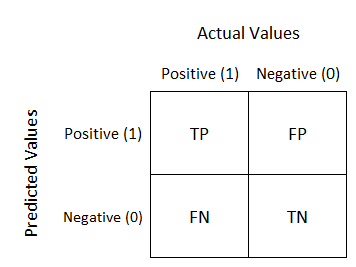

In [96]:
# overall accuracy of the model is: -
print(metrics.accuracy_score(pred_df.Converted_leads, pred_df.Predicted))

0.7887323943661971


In [97]:
#other metrics as well
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [101]:
# Calculating the sensitivity
print("overall sensitivity of the model is : - {}".format(round(TP/(TP+FN),3)))

print("-------------------------------------------------------------")
# Calculating the specificity
print("overall specificity of the model is : - {}".format(round(TN/(TN+FP),3)))



overall sensitivity of the model is : - 0.739
-------------------------------------------------------------
overall specificity of the model is : - 0.834


#### Drawing ROC curve

In [102]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [105]:
fpr, tpr, thresholds = metrics.roc_curve( pred_df.Converted_leads, pred_df.Predicted_conversion, drop_intermediate = False )

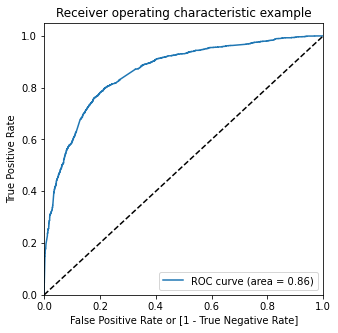

In [110]:
draw_roc(pred_df.Converted_leads, pred_df.Predicted_conversion)

In [118]:
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    pred_df[i]= pred_df.Predicted_conversion.map(lambda x: 1 if x > i else 0)
pred_df.head()

,Converted_leads,Predicted_conversion,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.881917,1,1,1,1,1,1,1,1,1,1,0
1,1,0.845796,1,1,1,1,1,1,1,1,1,1,0
2,1,0.706323,1,1,1,1,1,1,1,1,1,0,0
3,0,0.695820,1,1,1,1,1,1,1,1,0,0,0
4,0,0.065884,0,1,0,0,0,0,0,0,0,0,0


In [120]:
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix



num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(pred_df.Converted_leads, pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.474849  1.000000  0.000000
0.1   0.1  0.548849  0.991055  0.149000
0.2   0.2  0.702884  0.932674  0.495104
0.3   0.3  0.752292  0.895480  0.622818
0.4   0.4  0.788732  0.802260  0.776501
0.5   0.5  0.788732  0.739171  0.833546
0.6   0.6  0.779119  0.677495  0.871009
0.7   0.7  0.744467  0.548023  0.922095
0.8   0.8  0.710262  0.437853  0.956577
0.9   0.9  0.644981  0.270716  0.983397


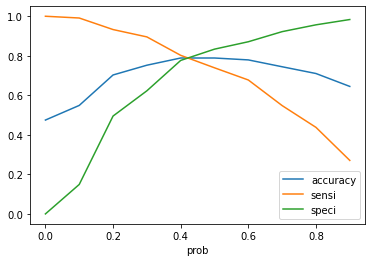

In [121]:
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

In [123]:
pred_df['pridicted_final'] = pred_df.Predicted_conversion.map( lambda x: 1 if x > 0.42 else 0)

pred_df.head()

,Converted_leads,Predicted_conversion,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,pridicted_final
0,1,0.881917,1,1,1,1,1,1,1,1,1,1,0,1
1,1,0.845796,1,1,1,1,1,1,1,1,1,1,0,1
2,1,0.706323,1,1,1,1,1,1,1,1,1,0,0,1
3,0,0.695820,1,1,1,1,1,1,1,1,0,0,0,1
4,0,0.065884,0,1,0,0,0,0,0,0,0,0,0,0


### Lets Make prediction on test dataset.

In [50]:
x_train.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,origin_Lead Add Form,source_Olark Chat,source_Welingak Website,last_activity_Approached upfront,last_activity_Converted to Lead,last_activity_Email Bounced,last_activity_Had a Phone Conversation,last_activity_Olark Chat Conversation,last_activity_SMS Sent,last_activity_View in browser link Clicked,occupation_Unemployed,occupation_Working Professional
533,0,0.011952,0.364877,0,0,0,0,0,0,0,0,0,0,0,1
846,0,0.000000,0.000000,1,0,0,0,0,0,0,0,0,0,1,0
7546,0,0.035857,0.372359,0,0,0,0,0,0,0,0,1,0,1,0
8631,0,0.019920,0.397447,0,0,0,0,0,0,0,0,1,0,1,0
7824,0,0.003984,0.081866,0,0,0,0,1,0,0,0,0,0,1,0


In [51]:
result = logisticRegr.predict(x_test)

In [52]:
res = pd.Series(np.round_(result,3))
res.rename(index="Result")

0       1
1       0
2       0
3       0
4       1
5       1
6       1
7       0
8       1
9       0
10      0
11      0
12      1
13      0
14      0
15      0
16      0
17      1
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      1
26      0
27      0
28      1
29      0
30      1
31      1
32      1
33      1
34      1
35      1
36      0
37      1
38      0
39      1
40      1
41      0
42      0
43      1
44      0
45      0
46      1
47      0
48      0
49      1
50      1
51      0
52      0
53      1
54      1
55      0
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      0
64      1
65      1
66      1
67      0
68      0
69      0
70      1
71      0
72      1
73      1
74      1
75      0
76      1
77      0
78      0
79      0
80      0
81      1
82      0
83      0
84      1
85      0
86      0
87      1
88      0
89      1
90      1
91      1
92      0
93      0
94      0
95      1
96      0
97      0
98      1
99      0


In [53]:
res.head()

0    1
1    0
2    0
3    0
4    1
dtype: int64

In [54]:
pred_res = pd.concat([x_test.reset_index(),res,y_test.reset_index(drop=True)],axis=1)

In [55]:
pred_res.rename(columns = ({0:"Predicted_result"}),inplace=True)

In [56]:
pred_res.head()

,index,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,origin_API,origin_Landing Page Submission,origin_Lead Add Form,origin_Lead Import,source_Click2call,source_Direct Traffic,source_Facebook,source_Google,source_Live Chat,source_Olark Chat,source_Organic Search,source_Pay per Click Ads,source_Press_Release,source_Reference,source_Referral Sites,source_Social Media,source_WeLearn,source_Welingak Website,source_bing,source_testone,last_activity_Approached upfront,last_activity_Converted to Lead,last_activity_Email Bounced,last_activity_Email Link Clicked,last_activity_Email Marked Spam,last_activity_Email Opened,last_activity_Email Received,last_activity_Form Submitted on Website,last_activity_Had a Phone Conversation,last_activity_Olark Chat Conversation,last_activity_Page Visited on Website,last_activity_SMS Sent,last_activity_Unreachable,last_activity_Unsubscribed,last_activity_View in browser link Clicked,last_activity_Visited Booth in Tradeshow,occupation_Businessman,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional,Predicted_result,Converted
0,2938,0,0.015936,0.485915,0.072727,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1
1,4301,1,0.003984,0.144366,0.018182,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
2,5904,1,0.011952,0.174296,0.054545,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
3,6881,1,0.035857,0.069102,0.081818,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,5195,0,0.015936,0.571303,0.072727,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1


In [57]:
pred_res["Predicted_correct"] = pred_res[["Predicted_result","Converted"]].apply(lambda x: "yes" if x["Predicted_result"] == x["Converted"] else "no",axis=1)

In [ ]:
pred_res.head()

In [ ]:
pred_res.Predicted_correct.value_counts()